# TODO

* Apply to other mutations (NF2, SMARCB1 and/or LZTR1)

* Create package with pipeline
1. Download data: 
    * Input -> 
        * Internal data - synapse id
        * External data - Other synapses dataset, url (https://depmap.org/portal/download/), csv
    * Output -> structured csv files
2. Process data: 
    * Input -> structured csv files
    * Output -> transformed data with PK id and all features from differents files (clinical, mutations, CNA, etc)
3. Create dataset
    * Input ->  transformed data with PK
    * Output -> unique dataframe with selected features and filtered data
4. Lightgbm model
    * Input ->  unique dataframe with selected features and filtered data
    * Output -> trained model, evaluation metrics
5. BERT
    * Input ->  list of important features and gen info from 'http://marrvel.org/data/omim/gene/symbol/{gene}'
    * Output -> topics, key words by topic, tree of topics



# DONE

* Subsample dataset with relevant types of cancer related with mutations in NF1, NF2, SMARCB1 and/or LZTR1
* Analyze important features by cluster
* Define model target
* Check shap feature importance set seed of umap


 * https://www.mayoclinic.org/es-es/diseases-conditions/neurofibromatosis/symptoms-causes/syc-20350490
 * https://www.nhs.uk/conditions/neurofibromatosis-type-1/
 * https://www.thieme-connect.com/products/ejournals/abstract/10.1055/s-0034-1382021
 * https://pubmed.ncbi.nlm.nih.gov/25062113/

In [1]:
import pandas as pd
import plotly.express as px

import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import umap.umap_ as umap
import hdbscan
import lightgbm as lgb

from sklearn.model_selection import train_test_split

from sklearn import metrics
import shap

from kmeans_interp.kmeans_feature_imp import KMeansInterp
import httplib2 as http
import json

try:
    from urlparse import urlparse
except ImportError:
    from urllib.parse import urlparse

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df_clinical = pd.read_csv("data/genie_v13_0/data_clinical.txt", sep="\t")
df_fusions = pd.read_csv("data/genie_v13_0/data_fusions.txt", sep="\t")
df_CNA = pd.read_csv("data/genie_v13_0/data_CNA.txt", sep="\t")
df_mutations = pd.read_csv("data/genie_v13_0/data_mutations_extended.txt", sep="\t", skiprows=1)
df_combined = pd.read_csv("data/genie_v13_0/genie_combined.bed", sep="\t")
df_hg19 = pd.read_csv("data/genie_v13_0/genie_data_cna_hg19.seg", sep="\t")

Columns (17,18,23,24,25,29) have mixed types. Specify dtype option on import or set low_memory=False.


In [3]:
df_mutations["Variant_Type"].value_counts()

SNP    95372
DEL     9760
INS     3928
DNP     1130
TNP       79
ONP       51
Name: Variant_Type, dtype: int64

In [4]:
df_mutations.shape

(110320, 123)

In [5]:
df_mutations.head()

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
0,ARID1A,8289,VICC,GRCh37,1,27106874,27106881,+,Frame_Shift_Del,DEL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CREBBP,1387,VICC,GRCh37,16,3843455,3843455,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IRS2,8660,VICC,GRCh37,13,110435765,110435765,+,Missense_Mutation,SNP,...,2/7822,7/78568,0/152,0/146,0/136,0/36,2/2466,0/74,0/4812,PASS
3,KIT,3815,VICC,GRCh37,4,55561891,55561891,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SMAD2,4087,VICC,GRCh37,18,45374948,45374948,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df_fusions.head()

,HUGO_SYMBOL,CENTER,TUMOR_SAMPLE_BARCODE,FUSION,DNA_SUPPORT,RNA_SUPPORT,FRAME,COMMENTS
0,ABCA5,VICC,GENIE-VICC-565922-unk-1,ABCA5-CDK12 fusion,yes,unknown,unknown,NaN
1,ABL1,VICC,GENIE-VICC-612351-unk-1,ABL1-FCN2 fusion,yes,unknown,unknown,NaN
2,ABLIM2,VICC,GENIE-VICC-943592-unk-1,ABLIM2-PDGFRA fusion,yes,unknown,unknown,NaN
3,ACACA,VICC,GENIE-VICC-665767-unk-1,ACACA-CDK12 fusion,yes,unknown,unknown,NaN
4,ACACB,VICC,GENIE-VICC-531696-unk-1,ACACB-CHD2 fusion,yes,unknown,unknown,NaN


In [7]:
uri = 'http://marrvel.org/data'
path = f'/decipher/variant/ENSG00000196712'

target = urlparse(uri+path)
method = 'GET'
body = ''

headers = {
'Accept': 'application/json',
}


h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

{'message': 'Invalid variant'}

In [8]:
df_mutations[df_mutations["Hugo_Symbol"]=="NF1"].head()

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
44,NF1,4763,VICC,GRCh37,17,29670092,29670092,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,NF1,4763,VICC,GRCh37,17,29684077,29684077,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
138,NF1,4763,VICC,GRCh37,17,29550587,29550587,+,Splice_Site,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
164,NF1,4763,VICC,GRCh37,17,29546048,29546048,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
297,NF1,4763,VICC,GRCh37,17,29665053,29665053,+,Nonsense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df_mutations[df_mutations["Hugo_Symbol"]=="NF1"]["Start_Position"].value_counts().head(20)

29677227    15
29665752    11
29576111    10
29553477     9
29533315     8
29553478     8
29552144     7
29562657     6
29562981     5
29541468     5
29556079     5
29509639     5
29562746     5
29588751     5
29685632     5
29684326     4
29486050     4
29661945     4
29528489     4
29667635     4
Name: Start_Position, dtype: int64

In [10]:
df_CNA_cols = list(df_CNA.columns)
df_CNA_cols.pop(0)
len(df_clinical[df_clinical["SAMPLE_ID"].isin(df_CNA_cols)])

14310

# IMPORTANT! Keep only patients that appear in data_mutations_extended

In [11]:
len(df_clinical)

18804

In [12]:
df_clinical["have_mutation"] = df_clinical["SAMPLE_ID"].isin(df_mutations["Tumor_Sample_Barcode"])
df_clinical = df_clinical[df_clinical["have_mutation"]].reset_index(drop=True)

In [13]:
len(df_clinical)

17005

In [14]:
df_clinical["is_NF1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="NF1"]["Tumor_Sample_Barcode"])
df_clinical["is_NF2"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="NF2"]["Tumor_Sample_Barcode"])
df_clinical["is_SMARCB1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="SMARCB1"]["Tumor_Sample_Barcode"])
df_clinical["is_LZTR1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="LZTR1"]["Tumor_Sample_Barcode"])

### Patients with NF1 mutation

In [15]:
len(df_clinical[df_clinical["is_NF1"]])

911

### cancer_type in NF1 mutation

In [16]:
df_clinical[df_clinical["is_NF1"]]["CANCER_TYPE"].value_counts()

Non-Small Cell Lung Cancer               167
Glioma                                   133
Breast Cancer                             99
Melanoma                                  90
Colorectal Cancer                         54
Bladder Cancer                            51
Endometrial Cancer                        50
Ovarian Cancer                            34
Skin Cancer, Non-Melanoma                 30
Soft Tissue Sarcoma                       22
Leukemia                                  20
Esophagogastric Cancer                    17
Cancer of Unknown Primary                 16
Hepatobiliary Cancer                      14
Prostate Cancer                           13
Thyroid Cancer                            12
Gastrointestinal Stromal Tumor             9
Head and Neck Cancer                       7
Small Bowel Cancer                         6
Renal Cell Carcinoma                       6
Uterine Sarcoma                            5
Adrenocortical Carcinoma                   5
Non-Hodgki

### Patients with NF2 mutation

In [17]:
len(df_clinical[df_clinical["is_NF2"]])

282

### cancer_type in NF2 mutation

In [18]:
df_clinical[df_clinical["is_NF2"]]["CANCER_TYPE"].value_counts()

Mesothelioma                      34
Non-Small Cell Lung Cancer        32
Renal Cell Carcinoma              30
CNS Cancer                        25
Bladder Cancer                    15
Breast Cancer                     15
Skin Cancer, Non-Melanoma         14
Melanoma                          14
Colorectal Cancer                 13
Glioma                            12
Endometrial Cancer                11
Cancer of Unknown Primary         10
Ovarian Cancer                     8
Thyroid Cancer                     7
Soft Tissue Sarcoma                7
Head and Neck Cancer               6
Nerve Sheath Tumor                 6
Pancreatic Cancer                  5
Esophagogastric Cancer             5
Cervical Cancer                    3
Embryonal Tumor                    2
Uterine Sarcoma                    2
Salivary Gland Cancer              1
Miscellaneous Brain Tumor          1
Leukemia                           1
Gastrointestinal Stromal Tumor     1
Hepatobiliary Cancer               1
P

### Patients with SMARCB1 mutation

In [19]:
len(df_clinical[df_clinical["is_SMARCB1"]])

141

### cancer_type in SMARCB1 mutation

In [20]:
df_clinical[df_clinical["is_SMARCB1"]]["CANCER_TYPE"].value_counts()

Colorectal Cancer             25
Non-Small Cell Lung Cancer    23
Bladder Cancer                12
Breast Cancer                 12
Renal Cell Carcinoma           9
Glioma                         7
Skin Cancer, Non-Melanoma      5
Endometrial Cancer             4
Thyroid Cancer                 4
Melanoma                       4
Soft Tissue Sarcoma            4
Leukemia                       3
Esophagogastric Cancer         3
CNS Cancer                     3
Cancer of Unknown Primary      3
Ovarian Cancer                 2
Salivary Gland Cancer          2
Head and Neck Cancer           2
Non-Hodgkin Lymphoma           2
Hepatobiliary Cancer           2
Prostate Cancer                1
Appendiceal Cancer             1
Mesothelioma                   1
Pancreatic Cancer              1
Thymic Tumor                   1
Penile Cancer                  1
Wilms Tumor                    1
Cervical Cancer                1
Anal Cancer                    1
Small Bowel Cancer             1
Name: CANC

### Patients with LZTR1 mutation

In [21]:
len(df_clinical[df_clinical["is_LZTR1"]])

12

### cancer_type in LZTR mutation

In [22]:
df_clinical[df_clinical["is_LZTR1"]]["CANCER_TYPE"].value_counts()

Breast Cancer                 2
Colorectal Cancer             2
Melanoma                      2
Small Bowel Cancer            1
Cancer of Unknown Primary     1
Salivary Gland Cancer         1
Glioma                        1
Non-Small Cell Lung Cancer    1
Pancreatic Cancer             1
Name: CANCER_TYPE, dtype: int64

## Bar plot with % of each cancer_type by relevant mutations
1. Calculate % of each cancer_type in the dataset
2. Calculate % of each cancer_type in patients with relevant mutations

In [23]:
cancer_type_counts = df_clinical["CANCER_TYPE"].value_counts()
df_cancer_type = pd.DataFrame(cancer_type_counts).reset_index()
df_cancer_type.columns = ["cancer_type", "count"]
df_cancer_type["pct"] = df_cancer_type["count"]/df_cancer_type["count"].sum()*100
df_cancer_type["pct"] = df_cancer_type["pct"].round(3)
df_cancer_type["mutation"] = "All"
df_cancer_type = df_cancer_type.sort_values("pct")

In [24]:
def add_pct_of_mutation(df_cancer_type, df_clinical, mutation):
    '''
    Add new column with count and % for each mutation
    '''
    cancer_type_counts_mut = df_clinical[df_clinical[f"is_{mutation}"]]["CANCER_TYPE"].value_counts()
    df_cancer_type_mut = pd.DataFrame(cancer_type_counts_mut).reset_index()
    df_cancer_type_mut.columns = ["cancer_type", f"count_{mutation}"]
    df_cancer_type = pd.merge(df_cancer_type, df_cancer_type_mut, on ="cancer_type", how="left")
    df_cancer_type[f"{mutation}_pct"] = df_cancer_type[f"count_{mutation}"]/df_cancer_type[f"count_{mutation}"].sum()*100
    df_cancer_type[f"{mutation}_pct"] = df_cancer_type[f"{mutation}_pct"].round(3)
    return df_cancer_type

In [25]:
def append_pct_of_mutation(df_cancer_type, df_clinical, mutation):
    '''
    Append count and percentage of each cancer type by mutation
    The resulting dataframe can be used to by plotted in one bar chart.
    '''
    cancer_type_counts_mut = df_clinical[df_clinical[f"is_{mutation}"]]["CANCER_TYPE"].value_counts()
    df_cancer_type_mut = pd.DataFrame(cancer_type_counts_mut).reset_index()
    df_cancer_type_mut.columns = ["cancer_type", "count"]
    df_cancer_type_mut["mutation"] = mutation
    df_cancer_type_mut["pct"] = df_cancer_type_mut["count"]/df_cancer_type_mut["count"].sum()*100
    df_cancer_type_mut["pct"] = df_cancer_type_mut["pct"].round(3)
    df_cancer_type = pd.concat([df_cancer_type, df_cancer_type_mut])
    return df_cancer_type

In [26]:
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "NF1")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "NF2")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "SMARCB1")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "LZTR1")

In [27]:
df_cancer_type.reset_index(inplace=True, drop=True)

In [28]:
df_cancer_type = df_cancer_type.fillna(0)

In [29]:
df_cancer_type.head()

,cancer_type,count,pct,mutation
0,Choroid Plexus Tumor,1,0.006,All
1,Breast Sarcoma,3,0.018,All
2,Retinoblastoma,3,0.018,All
3,Pineal Tumor,5,0.029,All
4,Hodgkin Lymphoma,6,0.035,All


## Visualize % of cancer type by mutation

In [30]:
fig = px.bar(df_cancer_type[df_cancer_type["mutation"]=="All"], 
             y='cancer_type', x='pct',
             orientation='h', height=800)
fig.show()

In [31]:
fig = px.bar(df_cancer_type, 
             y='cancer_type', x='pct', color = "mutation", barmode = "group",
             orientation='h', height=1600)
fig.show()

### Dimensional reduction 

In [32]:
df_CNA_cols = list(df_CNA.columns)
df_CNA_cols.pop(0)
len(df_clinical[df_clinical["SAMPLE_ID"].isin(df_CNA_cols)])

13449

In [33]:
df_clinical["is_in_CNA"] = df_clinical["SAMPLE_ID"].isin(df_CNA_cols)
df_clinical = df_clinical[df_clinical["is_in_CNA"]].reset_index(drop=True)

In [34]:
len(df_clinical)

13449

In [35]:
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].replace("<18y", 18)
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].replace(">89y", 89)
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].astype(int)

# Filter NF1 related cancer

In [36]:
selected_cancer_types = list(df_clinical[df_clinical["is_NF1"]]["CANCER_TYPE"].value_counts().index[:10])
selected_cancer_types = ['Non-Small Cell Lung Cancer', 'Glioma', 'Melanoma',
                         'Bladder Cancer', 'Endometrial Cancer', 'Skin Cancer, Non-Melanoma']
df_clinical["is_in_selected_cancer_types"] = df_clinical["CANCER_TYPE"].isin(selected_cancer_types)
df_clinical = df_clinical[df_clinical["is_in_selected_cancer_types"]].reset_index(drop=True)

In [37]:
len(df_clinical)

4394

In [38]:
df_mutations_hugo_symbol = df_mutations[["Hugo_Symbol", "Tumor_Sample_Barcode"]].copy()
df_mutations_hugo_symbol = df_mutations_hugo_symbol.drop_duplicates()
df_mutations_hugo_symbol = pd.get_dummies(df_mutations_hugo_symbol.set_index('Tumor_Sample_Barcode'), prefix='', prefix_sep='')
df_mutations_hugo_symbol.reset_index(inplace=True)
df_mutations_hugo_symbol = df_mutations_hugo_symbol.rename(columns={"Tumor_Sample_Barcode":"SAMPLE_ID"})
df_mutations_hugo_symbol = df_mutations_hugo_symbol.groupby("SAMPLE_ID").max()
df_mutations_hugo_symbol.reset_index(inplace=True)
mutations_hugo_symbol_cols = list(df_mutations_hugo_symbol.columns)
mutations_hugo_symbol_cols.pop(0)

'SAMPLE_ID'

In [39]:
df_mutations_hugo_symbol_var = df_mutations[["Hugo_Symbol", "Tumor_Sample_Barcode", "Variant_Type"]].copy()
df_mutations_hugo_symbol_var["Hugo_Symbol_variant"] = df_mutations_hugo_symbol_var["Hugo_Symbol"]+"_"+df_mutations_hugo_symbol_var["Variant_Type"]
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var[["Hugo_Symbol_variant", "Tumor_Sample_Barcode"]]
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.drop_duplicates()
df_mutations_hugo_symbol_var = pd.get_dummies(df_mutations_hugo_symbol_var.set_index('Tumor_Sample_Barcode'), prefix='', prefix_sep='')
df_mutations_hugo_symbol_var.reset_index(inplace=True)
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.rename(columns={"Tumor_Sample_Barcode":"SAMPLE_ID"})
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.groupby("SAMPLE_ID").max()
df_mutations_hugo_symbol_var.reset_index(inplace=True)
mutations_hugo_symbol_var_cols = list(df_mutations_hugo_symbol_var.columns)
mutations_hugo_symbol_var_cols.pop(0)

'SAMPLE_ID'

In [40]:
df_CNA_wo_hugo = df_CNA.set_index("HUGO_SYMBOL")
df_CNA_id =df_CNA_wo_hugo.T
df_CNA_id.reset_index(inplace=True)
df_CNA_id = df_CNA_id.rename(columns={"index":"SAMPLE_ID"})

df_clinical_CNA = pd.merge(df_clinical, df_CNA_id, on="SAMPLE_ID", how="left")

In [41]:
df_clinical_CNA = pd.merge(df_clinical, df_mutations_hugo_symbol, on="SAMPLE_ID", how="left")

#df_clinical_CNA = pd.merge(df_clinical_CNA, df_mutations_hugo_symbol, on="SAMPLE_ID", how="left")
#df_clinical_CNA = pd.merge(df_clinical, df_CNA_id, on="SAMPLE_ID", how="left")

In [42]:
df_clinical_CNA["NF1"].value_counts()

0    3878
1     516
Name: NF1, dtype: int64

In [43]:
df_CNA_HUGO_SYMBOLS_cols = list(df_CNA_id.columns)
df_CNA_HUGO_SYMBOLS_cols.pop(0)

'SAMPLE_ID'

In [44]:
#features = ["AGE_AT_SEQ_REPORT"]+df_CNA_HUGO_SYMBOLS_cols
features = ["AGE_AT_SEQ_REPORT"]+mutations_hugo_symbol_cols

In [45]:
df_clinical_CNA_scaled = StandardScaler().fit_transform(df_clinical_CNA[features].values)
df_clinical_CNA_scaled = pd.DataFrame(df_clinical_CNA_scaled)
df_clinical_CNA_scaled.columns = features

In [46]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(df_clinical_CNA_scaled[features])
embedding.shape

(4394, 2)

In [47]:
df_clinical_CNA['CANCER_TYPE_ID'] = df_clinical_CNA['CANCER_TYPE'].astype('category').cat.codes

In [48]:
df_clinical_CNA["UMAP_X"] = embedding[:, 0]
df_clinical_CNA["UMAP_Y"] = embedding[:, 1]

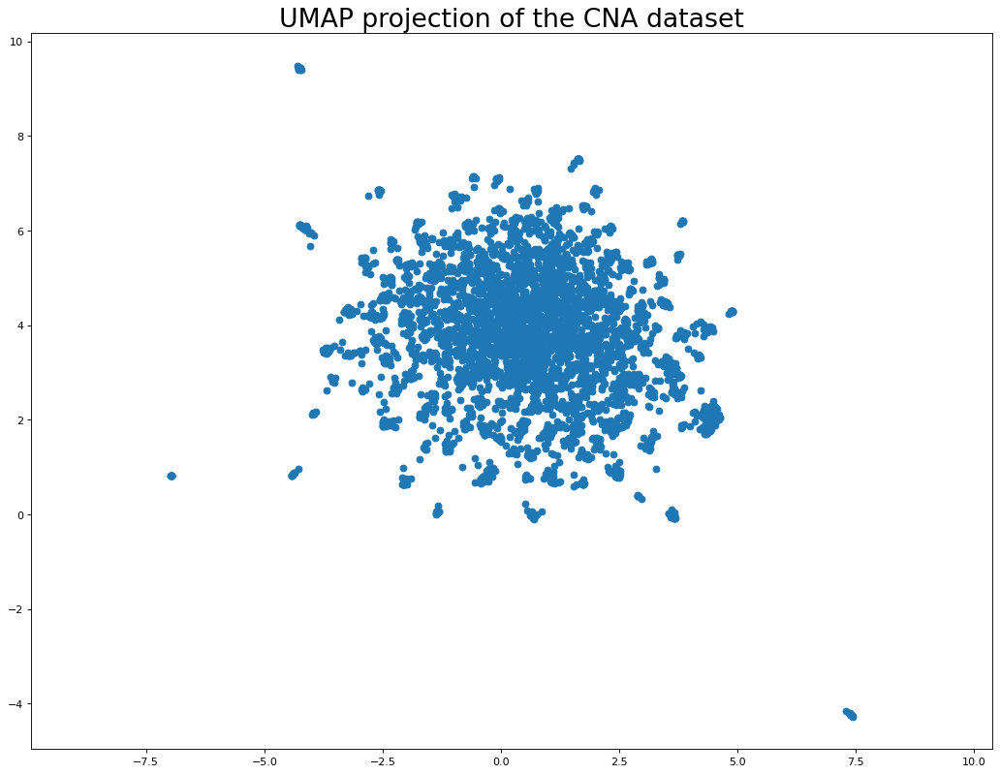

In [49]:
plt.figure(figsize=(16, 12), dpi=80)
plt.scatter(
    df_clinical_CNA["UMAP_X"],
    df_clinical_CNA["UMAP_Y"]
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the CNA dataset', fontsize=24);

In [50]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="CANCER_TYPE",
                 hover_data=['CANCER_TYPE'])
fig.show()

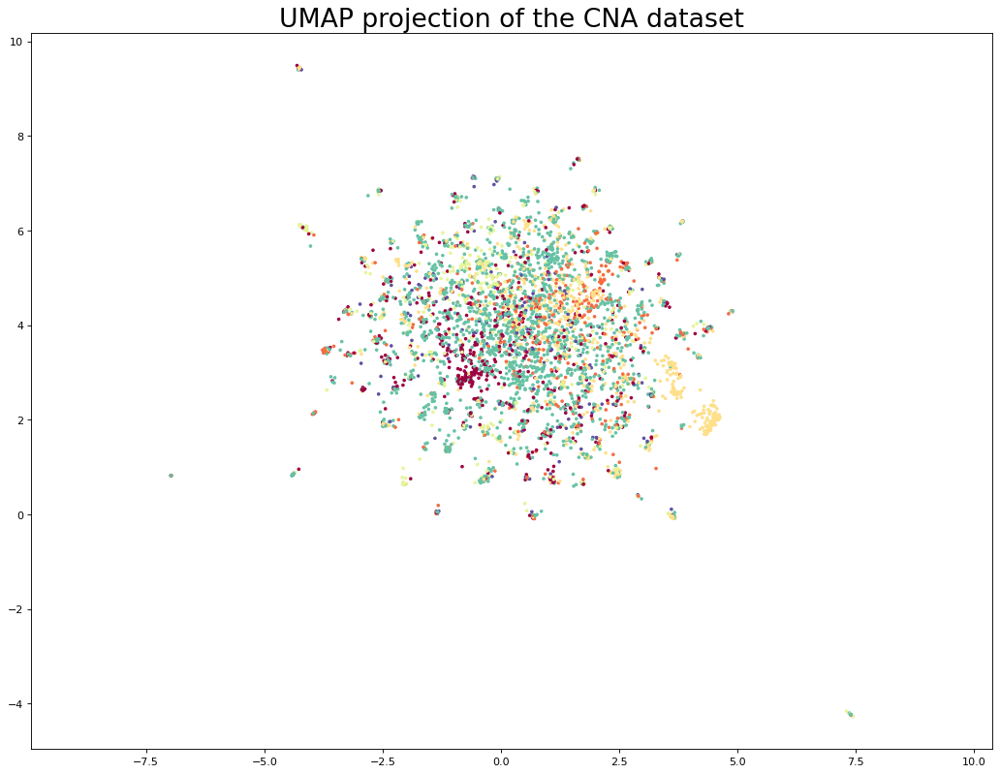

In [51]:
plt.figure(figsize=(16, 12), dpi=80)
plt.scatter(df_clinical_CNA["UMAP_X"], df_clinical_CNA["UMAP_Y"], c=df_clinical_CNA["CANCER_TYPE_ID"], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
#plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(len(df_clinical_CNA["CANCER_TYPE_ID"].unique())))
plt.title('UMAP projection of the CNA dataset', fontsize=24);

In [52]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_NF1",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [53]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_NF2",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [54]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_SMARCB1",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [55]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=50).fit(df_clinical_CNA[["UMAP_X", "UMAP_Y"]])
df_clinical_CNA["cluster"] = clusterer.labels_+1
df_clinical_CNA["cluster_str"] = df_clinical_CNA["cluster"].apply(lambda x: f"cluster_{x}") 

In [56]:
len(df_clinical_CNA["cluster"].unique())

4

In [57]:
df_clinical_CNA["cluster"].value_counts()[:10]

3    3061
0    1181
1      96
2      56
Name: cluster, dtype: int64

In [58]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="cluster_str",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [59]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="CANCER_TYPE",
                 hover_data=['CANCER_TYPE'])
fig.show()

### Lightgbm model to predict NF1

In [60]:
df_clinical_CNA[["NF1", "is_NF1"]].value_counts()

NF1  is_NF1
0    False     3878
1    True       516
dtype: int64

In [61]:
df_mutations_hugo_symbol[(df_mutations_hugo_symbol["SAMPLE_ID"]=="GENIE-DFCI-001400-6367")]["NF1"]

690    0
Name: NF1, dtype: uint8

In [62]:
df_clinical_CNA[(df_clinical_CNA["SAMPLE_ID"]=="GENIE-DFCI-001400-6367")]["NF1"]

Series([], Name: NF1, dtype: uint8)

In [63]:
df_mutations[(df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-001400-6367")]

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
67879,TP53,7157,DFCI,GRCh37,17,7577539,7577539,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67880,TSC2,7249,DFCI,GRCh37,16,2131765,2131766,+,Frame_Shift_Ins,INS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PASS
67881,EPHA3,2042,DFCI,GRCh37,3,89156936,89156936,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
df_clinical_CNA[(df_clinical_CNA["NF1"]==1)&(df_clinical_CNA["is_NF1"]==False)][["PATIENT_ID", "SAMPLE_ID", "NF1", "is_NF1"]]

,PATIENT_ID,SAMPLE_ID,NF1,is_NF1


In [65]:
features.remove("NF1")

In [66]:
X_train, X_test, y_train, y_test = train_test_split(df_clinical_CNA[features], df_clinical_CNA["is_NF1"], test_size=0.33, random_state=42)

train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test)

params_k = {
            'boosting_type': 'gbdt',
            'objective': 'binary',
            'metric': 'binary_logloss',
            'subsample': 0.8,
            'subsample_freq': 1,
            'learning_rate': 0.05,
            'feature_fraction': 0.8,
            'max_bin': 300,
            'n_estimators': 2000,
            'boost_from_average': False,
            "random_seed":42}

model_gbm = lgb.train(params_k, train_data, valid_sets=[test_data],
                  num_boost_round=2000, early_stopping_rounds=25,
                  verbose_eval=25)

[LightGBM] [Info] Number of positive: 342, number of negative: 2601
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741
[LightGBM] [Info] Number of data points in the train set: 2943, number of used features: 336
Training until validation scores don't improve for 25 rounds
[25]	valid_0's binary_logloss: 0.370169
[50]	valid_0's binary_logloss: 0.322993
[75]	valid_0's binary_logloss: 0.318413
Early stopping, best iteration is:
[66]	valid_0's binary_logloss: 0.317062


C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `n_estimators` in params. Will use it instead of argument

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:181: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



### Model metrics 

In [67]:
y_pred = model_gbm.predict(X_test)
threshold = 0.5
predictions = [1 if case>threshold else 0 for case in y_pred]
    
print("Overall Accuracy:",metrics.accuracy_score(y_test, predictions))
print("Overall Precision:",metrics.precision_score(y_test, predictions, average='macro'))
print("Overall Recall:",metrics.recall_score(y_test, predictions, average='macro'))

Overall Accuracy: 0.8917987594762233
Overall Precision: 0.8663534361851333
Overall Recall: 0.5587786568735992


In [68]:
print(metrics.classification_report(y_test, predictions))

              precision    recall  f1-score   support

       False       0.89      1.00      0.94      1277
        True       0.84      0.12      0.21       174

    accuracy                           0.89      1451
   macro avg       0.87      0.56      0.58      1451
weighted avg       0.89      0.89      0.85      1451



In [69]:
#import os
#os.environ["PATH"] += os.pathsep + "C:/Users/lucas/anaconda3/envs/hack4nf/lib/site-packages/bin/graphviz"

<AxesSubplot:>

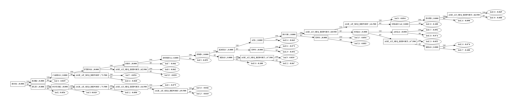

In [70]:
lgb.plot_tree(model_gbm)

In [71]:
import graphviz


In [72]:
tree_0 = lgb.create_tree_digraph(model_gbm, orientation="vertical")
s = graphviz.Source(tree_0.source, filename = "tree_0.gv", format = "png")
s.view()

'tree_0.gv.png'

In [73]:
tree_1 = lgb.create_tree_digraph(model_gbm, orientation="vertical", tree_index=1)
s_1 = graphviz.Source(tree_1.source, filename = "tree_1.gv", format = "png")
s_1.view()

'tree_1.gv.png'

In [74]:
explainer = shap.KernelExplainer(model_gbm.predict, X_test)#.shap_values(X_test)

Using 1451 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\shap\explainers\_tree.py:353: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



Feature importance of class 0


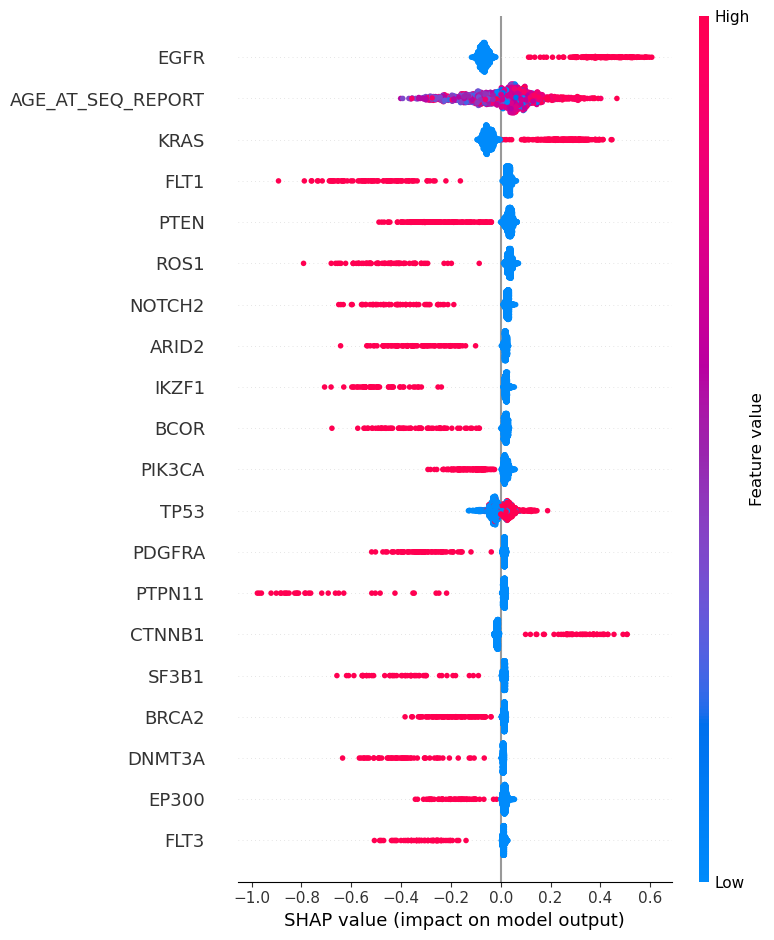

In [75]:
shap_values = shap.TreeExplainer(model_gbm).shap_values(X_test)
class_selected = 0
print(f"Feature importance of class {class_selected}")
shap.summary_plot(shap_values[class_selected], X_test)

Feature importance of class 1


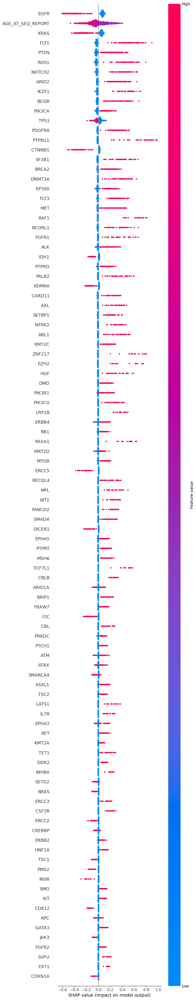

In [76]:
class_selected = 1
print(f"Feature importance of class {class_selected}")
shap.summary_plot(shap_values[class_selected], X_test, max_display=100)

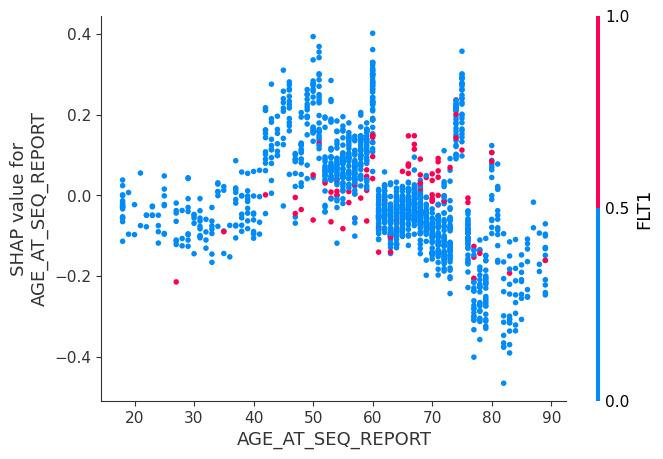

In [77]:
shap.dependence_plot(0, shap_values[1], X_test.values, feature_names=X_test.columns)

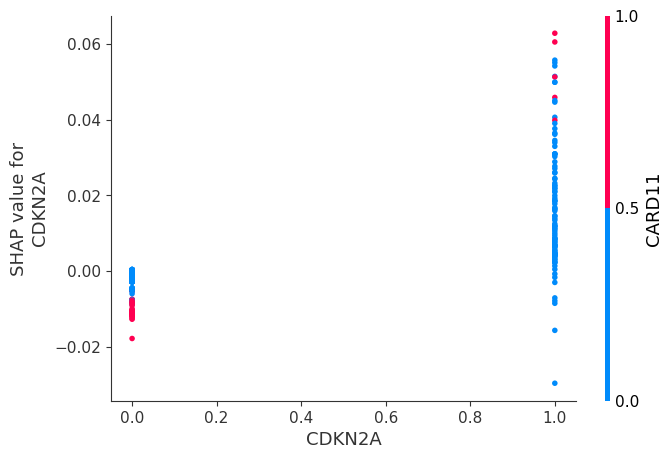

In [78]:
shap.dependence_plot("CDKN2A", shap_values[1], X_test.values, feature_names=X_test.columns)

In [79]:
tree_explainer = shap.TreeExplainer(model_gbm)

In [80]:
shap.initjs()

In [81]:
patient_index=1
shap.force_plot(tree_explainer.expected_value[0], shap_values[0][patient_index], X_test.values[patient_index], feature_names = X_test.columns)

In [82]:
shap_values_class_1 = np.abs(shap_values[1]).mean(0)

In [83]:
features_shap = model_gbm.feature_name()

In [84]:
df_importances_shap = pd.DataFrame()
df_importances_shap["feature"] = features_shap
df_importances_shap["shap_value"] = shap_values_class_1


In [85]:
df_importances_shap.sort_values("shap_value", inplace=True, ascending=False)

In [86]:
top_n_genes = 5
top_genes = list(df_importances_shap["feature"][:top_n_genes].values)

In [87]:
def find_gene_symbol(gene):
    uri = 'http://marrvel.org/data'
    path = f'/omim/gene/symbol/{gene}'

    target = urlparse(uri+path)
    method = 'GET'
    body = ''
    headers = {
    'Accept': 'application/json',
    }

    h = http.Http()

    response, content = h.request(
    target.geturl(),
    method,
    body,
    headers)
    data = json.loads(content)
    return data

In [88]:
data_top_genes = []
for top_gene in top_genes:
    data_gene = find_gene_symbol(top_gene)
    data_top_genes.append(data_gene)

In [89]:
data_top_genes[0]

{'phenotypes': [{'mimNumber': 131550,
   'phenotype': '?Inflammatory skin and bowel disease, neonatal, 2',
   'phenotypeMimNumber': 616069,
   'phenotypicSeriesNumber': 'PS614328',
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal recessive'},
  {'mimNumber': 131550,
   'phenotype': 'Adenocarcinoma of lung, response to tyrosine kinase inhibitor in',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'},
  {'mimNumber': 131550,
   'phenotype': 'Nonsmall cell lung cancer, response to tyrosine kinase inhibitor in',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'},
  {'mimNumber': 131550,
   'phenotype': '{Nonsmall cell lung cancer, susceptibility to}',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'}],
 'allelicVariants': [{'mimNumber': 1315

In [ ]:
df_importances_shap["gene_info"] = df_importances_shap["feature"].apply(lambda x: find_gene_symbol(x))
df_importances_shap["gene_info"] = df_importances_shap["gene_info"].fillna("NA")

In [ ]:
df_importances_shap["title"] = df_importances_shap["gene_info"].apply(lambda x: x["title"] if 'title' in x else None)
df_importances_shap["status"] = df_importances_shap["gene_info"].apply(lambda x: x["status"] if 'status' in x else None)
df_importances_shap["description"] = df_importances_shap["gene_info"].apply(lambda x: x["description"] if 'description' in x else None)

In [ ]:
df_importances_shap.head()

In [ ]:
df_importances_shap.to_csv("feature_importance_shap_lgb.csv", sep=";")

In [ ]:
df_clinical[df_clinical["is_NF1"]].head()

In [ ]:
#!git clone https://github.com/YousefGh/kmeans-feature-importance.git

In [ ]:
num_classes = 10
kms = KMeansInterp(
    n_clusters=num_classes, # Set the number of clusters to the number of actual unique categories
    random_state=1, 
    ordered_feature_names=features, # This method gets the feature names (Words) from
    feature_importance_method='wcss_min', # Or 'unsup2sup'
).fit(df_clinical_CNA_scaled[features])

# Create a new column to the dataset which will have cluster labels
labels = kms.labels_
df_clinical_CNA['Cluster_kms_wcss_min'] = labels

In [ ]:
len(df_clinical_CNA['Cluster_kms_wcss_min'].unique())

In [ ]:
kms.feature_importances_[0][:10] # Features here are words

In [ ]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:15], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(14,6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left");
    ax.tick_params(axis='both', which='major', labelsize=22)
    plt.title(f'Highest Weight Features wcss_min in Cluster {cluster_label}', fontsize='xx-large')
    plt.xlabel('Feature', fontsize=18)
    plt.ylabel('Weight', fontsize=18)

    plt.show();
    
    print('\n\n')

In [ ]:

kms = KMeansInterp(
    n_clusters=num_classes, # Set the number of clusters to the number of actual unique categories
    random_state=1, 
    ordered_feature_names=features, # This method gets the feature names (Words) from
    feature_importance_method='unsup2sup', # Or 'unsup2sup'
).fit(df_clinical_CNA_scaled[features])

# Create a new column to the dataset which will have cluster labels
labels = kms.labels_
df_clinical_CNA['Cluster_kms_unsup2sup'] = labels

In [ ]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:15], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(14,6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left");
    ax.tick_params(axis='both', which='major', labelsize=22)
    plt.title(f'Highest Weight Features unsup2sup in Cluster {cluster_label}', fontsize='xx-large')
    plt.xlabel('Feature', fontsize=18)
    plt.ylabel('Weight', fontsize=18)

    plt.show();
    
    print('\n\n')

In [ ]:
y_actu = df_clinical_CNA['Cluster_kms_wcss_min']
y_pred = df_clinical_CNA['Cluster_kms_unsup2sup']
#cm = metrics.confusion_matrix(y_actu, y_pred)

In [ ]:
df_confusion = pd.crosstab(y_actu, y_pred, rownames=['Cluster_kms_wcss_min'], colnames=['Cluster_kms_unsup2sup'])
#df_confusion = pd.crosstab(y_actu, y_pred, rownames=['Cluster_kms_wcss_min'], colnames=['Cluster_kms_unsup2sup'], margins=True)

In [ ]:
def plot_confusion_matrix(df_confusion, title='Confusion matrix', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion, cmap=cmap) # imshow
    #plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns, rotation=45)
    plt.yticks(tick_marks, df_confusion.index)
    #plt.tight_layout()
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)


plot_confusion_matrix(df_confusion.loc[1:,1:])

In [ ]:
import httplib2 as http
import json

try:
    from urlparse import urlparse
except ImportError:
    from urllib.parse import urlparse

headers = {
'Accept': 'application/json',
}

uri = 'http://rest.genenames.org'
path = '/fetch/hgnc_id/7765'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)

if response['status'] == '200':
# assume that content is a json reply
# parse content with the json module 
    data = json.loads(content)
    print('Symbol:' + data['response']['docs'][0]['symbol'])

else:
    print('Error detected: ' + response['status'])


In [ ]:
data

In [ ]:
uri = 'http://marrvel.org/data'
path = '/gene/taxonId/9606/entrezId/4763'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

In [ ]:
data["entrezSummary"]

In [ ]:
uri = 'http://marrvel.org/data'
path = '/omim/gene/symbol/NF1'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

In [ ]:
target = urlparse("http://marrvel.org/human/gene/4763")
uri = 'http://marrvel.org/data'
path = '/gtex/gene/entrezId/4763'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

In [ ]:
filter_1 = df_clinical["is_NF1"]
filter_2 = df_clinical["CANCER_TYPE"]=="Non-Small Cell Lung Cancer"
df_clinical[filter_1&filter_2]

In [ ]:
df_clinical.head()

In [ ]:
df_clinical[df_clinical["ONCOTREE_CODE"]=="NFIB"]

In [ ]:
df_clinical[df_clinical["CANCER_TYPE_DETAILED"]=="Neurofibroma"]

In [ ]:
sample_neuro = df_clinical[df_clinical["CANCER_TYPE_DETAILED"]=="Neurofibroma"]["SAMPLE_ID"].values

In [ ]:
df_fusions.head()

In [ ]:
df_fusions[df_fusions["TUMOR_SAMPLE_BARCODE"].isin(sample_neuro)]

In [ ]:
list(sample_neuro)

In [ ]:
df_CNA.head()

In [ ]:
len(df_CNA.columns)

In [ ]:
df_CNA[df_CNA["HUGO_SYMBOL"]=="NF1"]

In [ ]:
df_CNA["GENIE-DFCI-002343-5267"].describe()

In [ ]:
df_CNA["GENIE-DFCI-004738-3279"].describe()

In [ ]:
#df_CNA["GENIE-MDA-2134-4189"]

In [ ]:
df_mutations.head()

In [ ]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-002343-5267"]

In [ ]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-004738-3279"]

In [ ]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-MDA-2134-4189"]